In [1]:
import numpy as np
import pandas as pd
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib import cm, colors

from ecomplexity import ecomplexity
from ecomplexity import proximity

%config InlineBackend.figure_format = 'retina'

In [2]:
# Looking at some graphs below, we might exclude frontends like Jupyter, Shell?

**1 -- data preparation**

In [3]:
# data IN
data = pd.read_csv("../data/languages.csv")

In [4]:
# filter functions
def drop_specifics_from_list(data, filter_list):
    """filter specific languages from list -- motivated by RM del Rio-Chanona et al 2023"""
    data = data[~data["language"].str.contains(filter_list, case=False, regex=True)]
    return data

def top_languages_filter(data, nr_languages):
    """keep top x number of languages ONLY"""
    top_languages = data.groupby(["language"])["num_pushers"].agg("sum").reset_index().sort_values(by="num_pushers", ascending=False)
    top_languages = list(top_languages["language"])[:nr_languages]
    data = data[data["language"].isin(top_languages)]
    return data
def drop_country_codes_from_list(data, country_list):
    data = data[~data["iso2_code"].isin(country_list)]
    return data

def dataframe_for_ecomplexity(data, focal_year, quarter_list):
    """aggregate and transform dataframe for ecomplexity functions"""
    data = data[(data["year"]==focal_year) & (data["quarter"].isin(quarter_list))]
    data = data\
        .groupby(["year", "iso2_code", "language"])["num_pushers"]\
        .agg("sum")\
        .reset_index()\
        .sort_values(by="num_pushers", ascending=False)    
    return data

In [5]:
prev_filter = "|".join(["yaml", "json", "text", "svg", "Markdown", "xml"])
df = drop_specifics_from_list(data, filter_list=prev_filter)
df = top_languages_filter(df, nr_languages=150)
df = drop_country_codes_from_list(df, country_list=["EU"])
df = dataframe_for_ecomplexity(df, focal_year=2020, quarter_list=[1,2,3,4])
print(df.shape)

(5687, 4)


In [6]:
top20_langs=top_languages_filter(df, nr_languages=20).language.unique()

In [7]:
# calculate country and language complexity
key_cols = {
    "time": "year",
    "loc": "iso2_code",
    "prod": "language",
    "val": "num_pushers",
}

cdf = ecomplexity(df, key_cols)

2020


In [8]:
# export
cdf.to_csv("../outputs/complexity_table.csv", sep=";", index=False)

In [9]:
cdf[["eci", "iso2_code"]].drop_duplicates().sort_values(by="eci", ascending=False).head(10)

,eci,iso2_code
4970,2.135487,DE
19596,2.099929,US
6532,2.097117,GB
6390,2.068866,FR
3266,2.003959,CA
9372,1.957577,JP
16472,1.950932,RU
4118,1.947736,CN
13916,1.943486,NL
994,1.916909,AU


In [10]:
cdf[["eci", "iso2_code"]].drop_duplicates().sort_values(by="eci", ascending=False).tail(10)

,eci,iso2_code
10366,-1.143112,LA
17750,-1.197607,SO
13064,-1.197607,MW
3124,-1.240278,BZ
2840,-1.240278,BW
2414,-1.240278,BN
10792,-1.240278,LR
1846,-1.240278,BF
1420,-1.240278,BB
12922,-1.240278,MV


In [11]:
cdf[["pci", "language"]].drop_duplicates().sort_values(by="pci", ascending=False).head(20)

,pci,language
81,2.787814,POV-Ray SDL
59,2.734478,Liquid
0,2.695185,AMPL
77,2.693215,OpenSCAD
35,2.686180,G-code
56,2.672089,LLVM
115,2.669856,SourcePawn
60,2.652813,Logos
24,2.652813,DTrace
122,2.650848,SystemVerilog


In [12]:
cdf[["pci", "language"]].drop_duplicates().sort_values(by="pci", ascending=False).tail(20)

,pci,language
2,0.076501,ASP.NET
14,0.061146,C#
128,-0.000427,TypeScript
110,-0.043622,Shell
92,-0.095112,Python
123,-0.146159,TSQL
57,-0.242871,Less
55,-0.279945,Kotlin
121,-0.325187,Swift
47,-0.435670,Hack


**2 -- complexity visuals**


In [13]:
def mcl_raw_matrix(df, key_columns, heatmap, size, ax=None):
    table = df[key_columns]
    
    table = pd.pivot_table(table,
        values=key_columns[2],
        index=key_columns[1],
        columns=key_columns[0],
        aggfunc=np.sum,
        margins=True,
        margins_name='total')

    table = table\
            .sort_values(by=["total"], ascending=False, axis=0)\
            .sort_values(by=["total"], ascending=False, axis=1)

    table = table.drop(["total"], axis=1).drop(["total"], axis=0)

    table = np.log10(table)
    table.replace([np.inf, -np.inf], 0, inplace=True)

    if heatmap==False:
        return table
    else:
        if ax is None:
            ax = plt.gca()
        sns.heatmap(table, cbar=False, cmap="Blues", ax=ax)
        ax.set_xlabel("Countries", size=size)
        ax.set_ylabel("Languages", size=size)
        ax.set_xticklabels("")
        ax.tick_params("y", labelsize=size-15)
        ax.tick_params(left = False, bottom = False)

        my_cmap = plt.cm.get_cmap('Blues')
        colors = my_cmap(table.values.tolist())

        sm = ScalarMappable(cmap=my_cmap, norm=plt.Normalize(0,table.values.max()))
        sm.set_array([])
        cbar = plt.colorbar(sm, orientation="vertical", pad=0.1, shrink=0.9925, aspect=40, ax=ax)
        cbar.ax.set_ylabel("Number of pushers", size=size)
        cbar.ax.get_yaxis().labelpad = 15
        cbar.ax.tick_params(labelsize=size-5)
        cbar.set_ticks([0, 1, 2, 3, 4, 5, 6])
        cbar.set_ticklabels([r'$10^0$', r'$10^1$', r'$10^2$', r'$10^3$', r'$10^4$', r'$10^5$', r'$10^6$'])

/var/folders/2p/6l40fg513x76rr7vpl0f6_6m0000gn/T/ipykernel_23777/383583959.py:4: FutureWarning: The provided callable <function sum at 0x1074822a0> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  table = pd.pivot_table(table,
/var/folders/2p/6l40fg513x76rr7vpl0f6_6m0000gn/T/ipykernel_23777/383583959.py:4: FutureWarning: The provided callable <function sum at 0x1074822a0> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  table = pd.pivot_table(table,
/var/folders/2p/6l40fg513x76rr7vpl0f6_6m0000gn/T/ipykernel_23777/383583959.py:4: FutureWarning: The provided callable <function sum at 0x1074822a0> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass

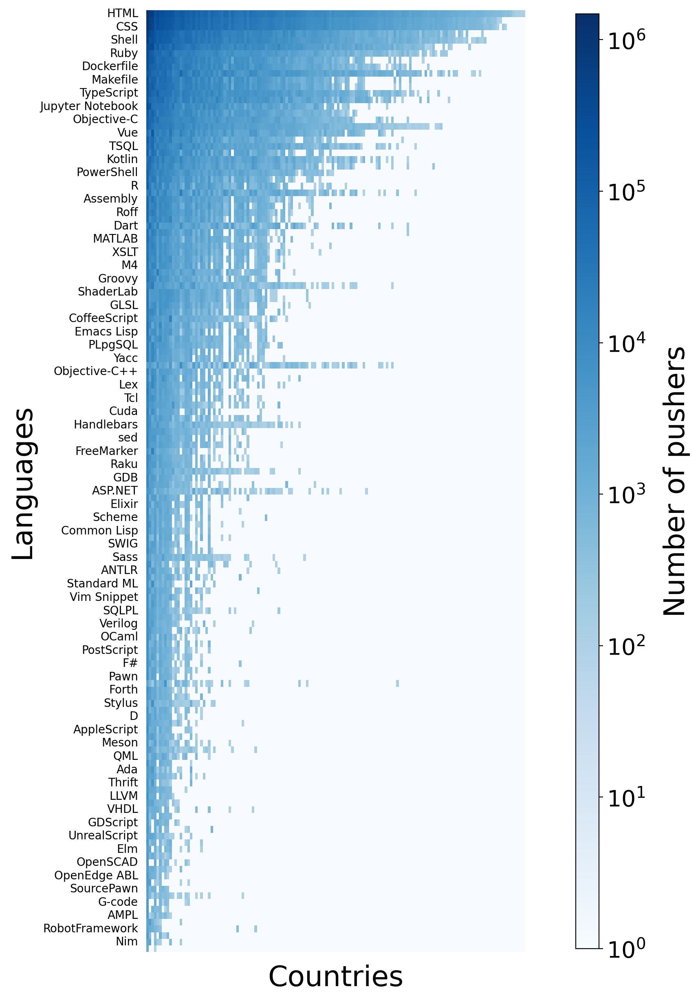

In [14]:
fig, ax = plt.subplots(1,1, figsize=(8, 15))
mcl_raw_matrix(cdf, key_columns=["iso2_code", "language", "num_pushers"], heatmap=True, size=25, ax=ax)

In [15]:
def mcl_matrix(df, key_columns, heatmap, size, ax=None):
    table = df[key_columns]
    table.loc[table[key_columns[2]] >=1, key_columns[2]] = 1
    table.loc[table[key_columns[2]] < 1, key_columns[2]] = 0
    
    table = pd.pivot_table(table,
        values=key_columns[2],
        index=key_columns[1],
        columns=key_columns[0],
        aggfunc="sum",  # Change np.sum to "sum"
        margins=True,
        margins_name='total')
    
    table = table\
        .sort_values(by=["total"], ascending=False, axis=0)\
        .sort_values(by=["total"], ascending=False, axis=1)

    table = table.drop(["total"], axis=1).drop(["total"], axis=0)

    if heatmap==False:
        return table
    else:
        if ax is None:
            ax = plt.gca()
        sns.heatmap(table, cbar=False, cmap="Blues", ax=ax)
        ax.set_title("RCA", size=size+2)
        ax.set_xlabel("Countries", size=size)
        ax.set_ylabel("Languages", size=size)
        ax.set_xticklabels("")
        ax.set_yticklabels("")
        ax.tick_params(left = False, bottom = False)
        

def mcc_matrix(df, key_columns, heatmap, size=18, ax=None):
    mat = mcl_matrix(df, key_columns, heatmap=False, size=size).values
    t_mat = mat.transpose()

    mccp = np.dot(t_mat, mat)
    mccp = pd.DataFrame(mccp, columns=list(mcl_matrix(df, key_columns, heatmap=False, size=size).columns))

    if heatmap==False:
        return mccp
    else:
        if ax is None:
            ax = plt.gca()
        sns.heatmap(mccp, cbar=False, cmap="Blues", ax=ax)
        ax.set_title("Mcc' ", size=size)
        ax.set_xlabel("Countries", size=size)
        ax.set_ylabel("Countries", size=size)
        ax.set_xticklabels("")
        ax.set_yticklabels("")
        ax.tick_params(left = False, bottom = False)


def mll_matrix(df, key_columns, heatmap, size, ax=None):
    mat = mcl_matrix(df, key_columns, heatmap=False, size=size).values
    t_mat = mat.transpose()
    mllp = np.dot(mat, t_mat) 
    mllp = pd.DataFrame(mllp, columns=list(mcl_matrix(df, key_columns, heatmap=False, size=size).index))

    if heatmap==False:
        return mllp
    else:
        if ax is None:
            ax = plt.gca()
        sns.heatmap(mllp, cbar=False, cmap="Blues", ax=ax)
        ax.set_title("Mll' ", size=size+2)
        ax.set_xlabel("Languages", size=size)
        ax.set_ylabel("Languages", size=size)
        ax.set_xticklabels("")
        ax.set_yticklabels("")
        ax.tick_params(left = False, bottom = False)


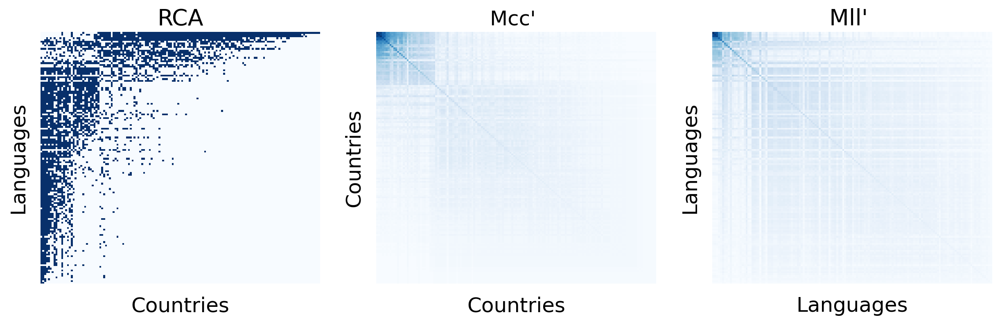

In [16]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4))
mcl_matrix(cdf, key_columns=["iso2_code", "language", "rca"], heatmap=True, size=18, ax=ax[0])
mcc_matrix(cdf, key_columns=["iso2_code", "language", "rca"], heatmap=True, size=18, ax=ax[1])
mll_matrix(cdf, key_columns=["iso2_code", "language", "rca"], heatmap=True, size=18, ax=ax[2])

In [17]:
def diversity_avg_ubiquity_complexity_scatter(df, ax=None):
    rca01 = df["rca"] >= 1
    df["rca01"] = rca01.astype(int) 
    df["w_ubi"] = df["rca01"] * df["ubiquity"]
    df["sum_w_ubi"] = df.groupby(["iso2_code"])["w_ubi"].transform("sum")    
    df["nr_rca01"] = df.groupby(["iso2_code"])["rca01"].transform("sum")
    df["mean_ubi"] = df["sum_w_ubi"] / df["nr_rca01"]

    df = df[["iso2_code", "eci", "diversity", "mean_ubi"]].drop_duplicates()
    #df["eci"] = (df["eci"] - df["eci"].min()) / (df["eci"].max() - df["eci"].min())

    vmin = min(df["eci"])
    vmax = max(df["eci"])
    norm = colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
    mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues)
    eci_values = mapper.to_rgba(df["eci"].to_list())

    if ax is None:
        ax = plt.gca()
    ax.scatter(df["diversity"], df["mean_ubi"], color=eci_values, s=55)
    ax.set_xlabel("Language diversity", size=20)
    ax.set_ylabel("Average language ubiquity", size=20)
    ax.tick_params("x", labelsize=15)
    ax.tick_params("y", labelsize=15)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    cbar = fig.colorbar(mapper, pad=0.02, shrink=0.975, ax=ax)
    cbar.ax.set_ylabel('Software complexity', rotation=90, labelpad=15, fontsize=20)
    cbar.ax.tick_params(labelsize=15)

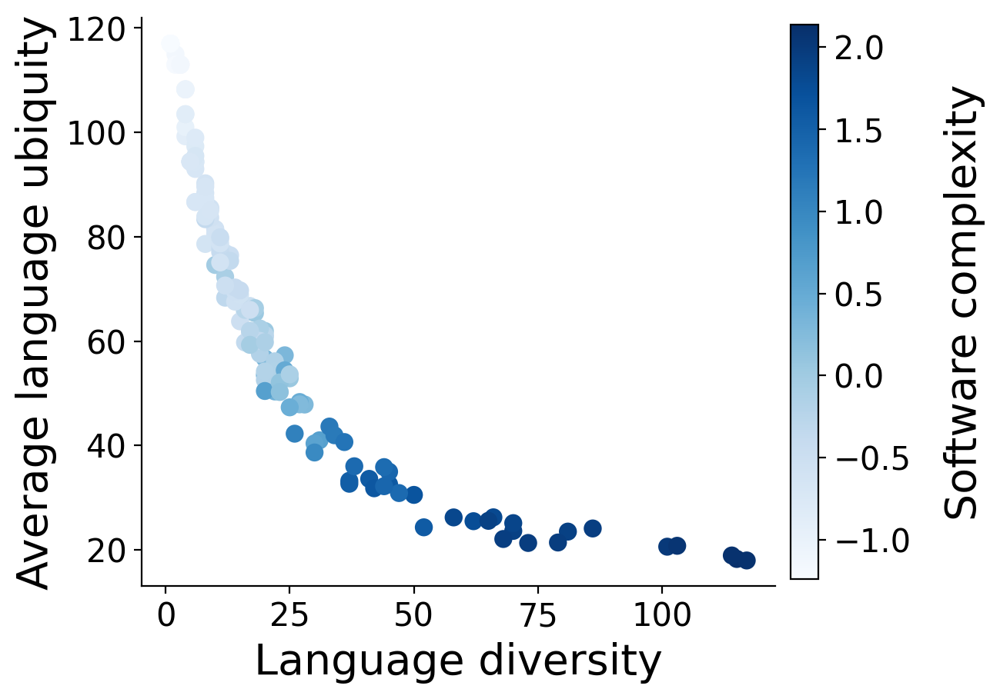

In [18]:
diversity_avg_ubiquity_complexity_scatter(cdf)

In [19]:
def ubiquity_avg_diversity_complexity_scatter(df, ax=None):
    rca01 = df["rca"] >= 1
    df["rca01"] = rca01.astype(int) 
    df["w_div"] = df["rca01"] * df["diversity"]
    df["sum_w_div"] = df.groupby(["language"])["w_div"].transform("sum")
    df["nr_rca01"] = df.groupby(["language"])["rca01"].transform("sum")
    df["mean_div"] = df["sum_w_div"] / df["nr_rca01"]

    df = df[["language", "pci", "ubiquity", "mean_div"]].drop_duplicates()

    vmin = min(df["pci"])
    vmax = max(df["pci"])
    norm = colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
    mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues)
    pci_values = mapper.to_rgba(df["pci"].to_list())

    if ax is None:
        ax = plt.gca()
    ax.scatter(df["ubiquity"], df["mean_div"], color=pci_values, s=55)
    ax.set_xlabel("Language ubiquity", size=20)
    ax.set_ylabel("Average language diversity", size=20)
    ax.tick_params("x", labelsize=15)
    ax.tick_params("y", labelsize=15)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    cbar = fig.colorbar(mapper, pad=0.02, shrink=0.975, ax=ax)
    cbar.ax.set_ylabel('Language complexity', rotation=90, labelpad=15, fontsize=20)
    cbar.ax.tick_params(labelsize=15)

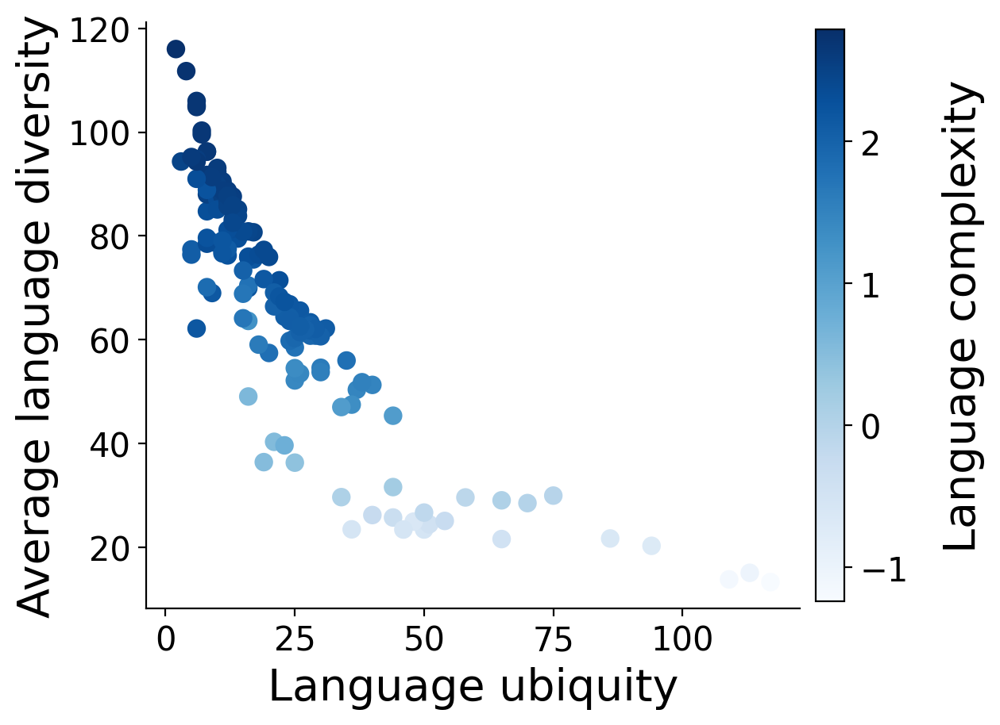

In [20]:
ubiquity_avg_diversity_complexity_scatter(cdf)

In [21]:
def complexity_complexity_matrix(df, heatmap, ax=None):
    # to sort location by eci
    location_sorter = df[["iso2_code", "eci"]]\
        .drop_duplicates()\
        .sort_values(by="eci", ascending=False)

    # only categories w/ RCA
    table = df[df["rca"] >= 1]
    table = table[["iso2_code", "language", "pci"]].drop_duplicates()
    
    table = pd.pivot_table(table,
        values="pci",
        index=["iso2_code"],
        columns=["language"],
        aggfunc=np.mean,
        margins=True,
        margins_name='total')
    
    # add the location_sorter and sort
    table = pd.merge(
        table,
        location_sorter,
        on="iso2_code",
        how="left"
    )

    table = table.sort_values(by=["eci"], ascending=False, axis=0)\
        .set_index("iso2_code")\
        .sort_values(by=["total"], ascending=False, axis=1)

    # remove supporter rows and cols
    table = table.drop(["eci"], axis=1).drop(["total"], axis=1).drop(["total"], axis=0)

    if heatmap==False:
        return table
    else:
        if ax is None:
            ax = plt.gca()

    sns.heatmap(table, cbar=False, cmap="Blues", ax=ax)
    ax.set_xlabel("Languages sorted by \n their complexity", size=20)
    ax.set_ylabel("Countries sorted by \n their complexity", size=20)
    #ax.set_xticklabels("")
    #ax.set_yticklabels("")
    ax.tick_params(left = False, bottom = False)

    # colorbar settings
    vmin = min(df["pci"])
    vmax = max(df["pci"])
    norm = colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
    mapper = cm.ScalarMappable(norm=norm, cmap=cm.Blues)
    cbar = fig.colorbar(mapper, shrink=0.975, pad=0.02, ax=ax)
    cbar.ax.set_ylabel('Software complexity', rotation=90, labelpad=15, fontsize=20)
    cbar.ax.tick_params(labelsize=15)

/var/folders/2p/6l40fg513x76rr7vpl0f6_6m0000gn/T/ipykernel_23777/2160885852.py:11: FutureWarning: The provided callable <function mean at 0x107483380> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  table = pd.pivot_table(table,
/var/folders/2p/6l40fg513x76rr7vpl0f6_6m0000gn/T/ipykernel_23777/2160885852.py:11: FutureWarning: The provided callable <function mean at 0x107483380> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  table = pd.pivot_table(table,
/var/folders/2p/6l40fg513x76rr7vpl0f6_6m0000gn/T/ipykernel_23777/2160885852.py:11: FutureWarning: The provided callable <function mean at 0x107483380> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current

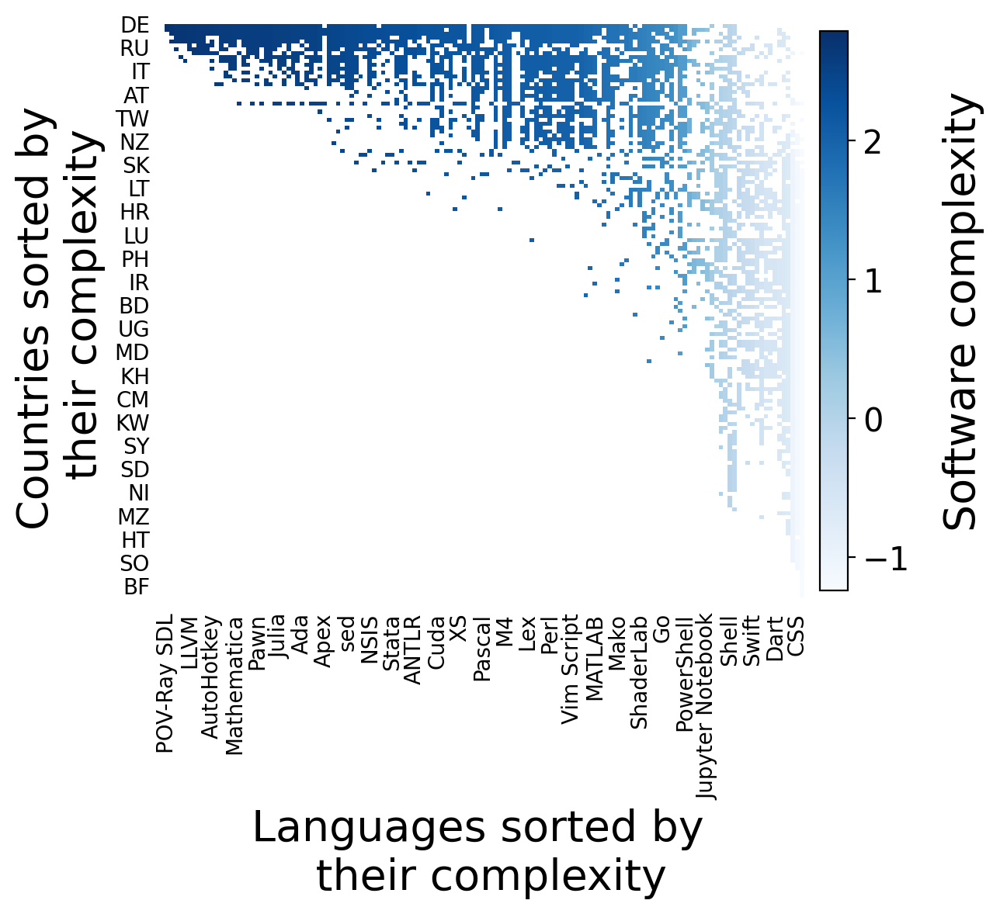

In [22]:
complexity_complexity_matrix(cdf, heatmap=True)

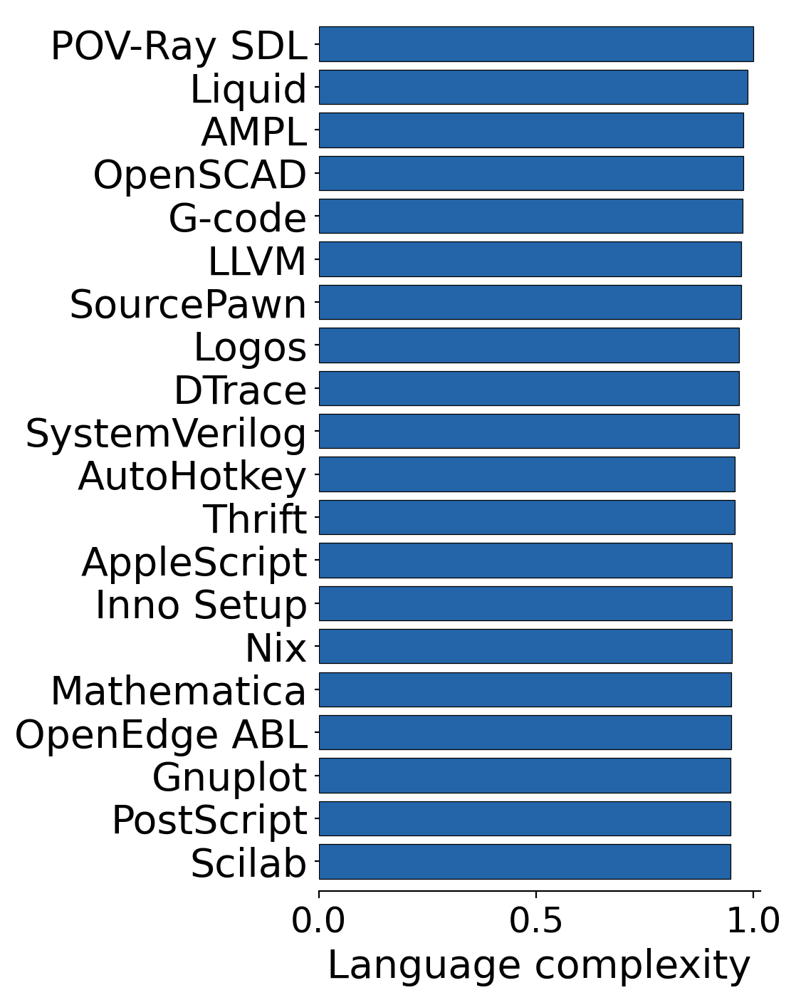

In [23]:
def poi_complexity_plot_top10(data, label_size, ax=None):
    data = data[["language", "pci"]].drop_duplicates()
    data["pci_norm"] = (data["pci"] - data["pci"].min()) / (data["pci"].max() - data["pci"].min())
    data = data.sort_values(by=["pci_norm"], ascending=True)
    data = data.iloc[-20:,]

    if ax is None:
        ax = plt.gca()
    ax.barh(data["language"], data["pci_norm"], color="#2465a9", edgecolor="black", linewidth=0.45)

    ax.margins(0.015, tight=True)
    ax.set_xlabel("Language complexity", size=label_size)
    ax.tick_params("y", size=2, labelsize=label_size)
    ax.tick_params("x", labelsize=label_size-2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

fig, ax = plt.subplots(1,1, figsize=(4,8))
poi_complexity_plot_top10(cdf, label_size=20, ax=ax)

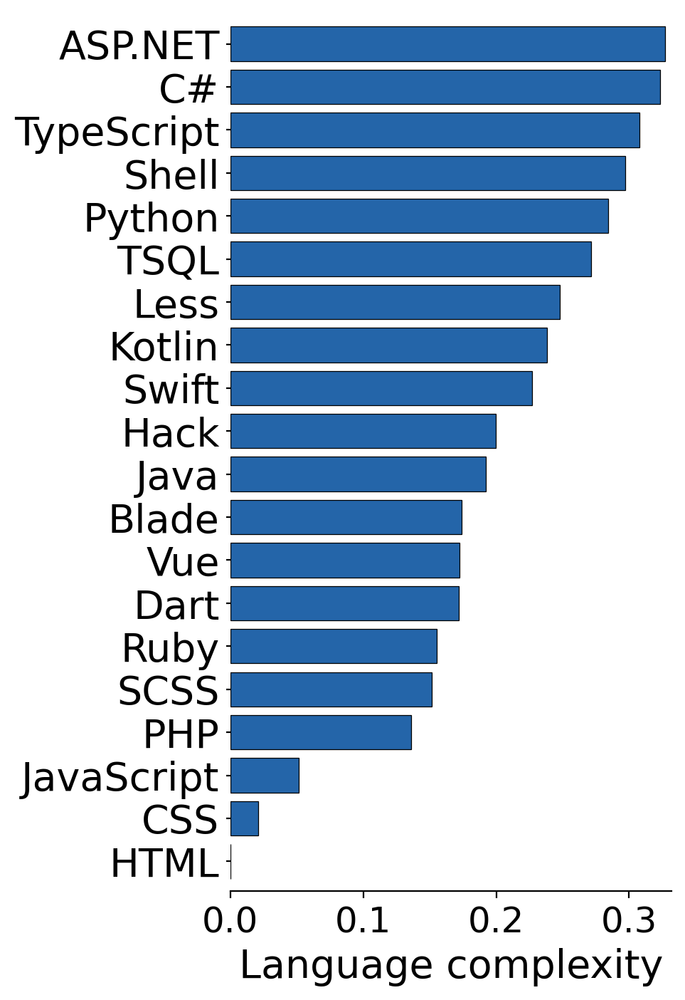

In [24]:
def poi_complexity_plot_bottom10(data, label_size, ax=None):
    data = data[["language", "pci"]].drop_duplicates()
    data["pci_norm"] = (data["pci"] - data["pci"].min()) / (data["pci"].max() - data["pci"].min())
    data = data.sort_values(by=["pci_norm"], ascending=False)
    data = data.iloc[-20:,].sort_values(by=["pci_norm"], ascending=True)

    if ax is None:
        ax = plt.gca()
    ax.barh(data["language"], data["pci_norm"], color="#2465a9", edgecolor="black", linewidth=0.45)

    ax.margins(0.015, tight=True)
    ax.set_xlabel("Language complexity", size=label_size)
    ax.tick_params("y", size=2, labelsize=label_size)
    ax.tick_params("x", labelsize=label_size-2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

fig, ax = plt.subplots(1,1, figsize=(4,8))
poi_complexity_plot_bottom10(cdf, label_size=20, ax=ax)

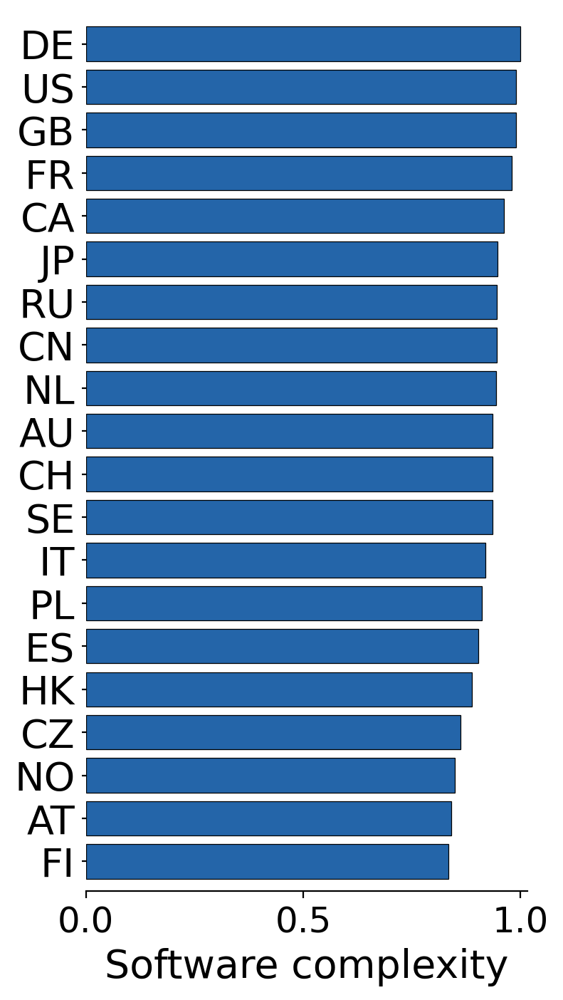

In [25]:
def software_complexity_plot_top10(data, label_size, ax=None):
    data = data[["iso2_code", "eci"]].drop_duplicates()
    data["eci_norm"] = (data["eci"] - data["eci"].min()) / (data["eci"].max() - data["eci"].min())
    data = data.sort_values(by=["eci_norm"], ascending=True)
    data = data.iloc[-20:,]

    if ax is None:
        ax = plt.gca()
    ax.barh(data["iso2_code"], data["eci_norm"], color="#2465a9", edgecolor="black", linewidth=0.45)

    ax.margins(0.015, tight=True)
    ax.set_xlabel("Software complexity", size=label_size)
    ax.tick_params("y", size=2, labelsize=label_size)
    ax.tick_params("x", labelsize=label_size-2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

fig, ax = plt.subplots(1,1, figsize=(4,8))
software_complexity_plot_top10(cdf, label_size=20, ax=ax)

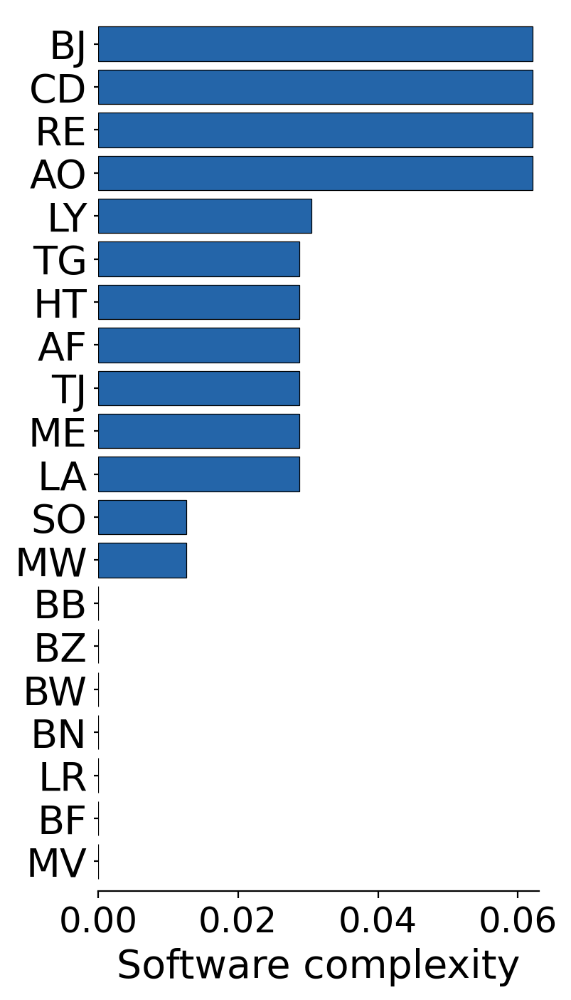

In [26]:
def software_complexity_plot_bottom10(data, label_size, ax=None):
    data = data[["iso2_code", "eci"]].drop_duplicates()
    data["eci_norm"] = (data["eci"] - data["eci"].min()) / (data["eci"].max() - data["eci"].min())
    data = data.sort_values(by=["eci_norm"], ascending=False)
    data = data.iloc[-20:,].sort_values(by=["eci_norm"], ascending=True)

    if ax is None:
        ax = plt.gca()
    ax.barh(data["iso2_code"], data["eci_norm"], color="#2465a9", edgecolor="black", linewidth=0.45)

    ax.margins(0.015, tight=True)
    ax.set_xlabel("Software complexity", size=label_size)
    ax.tick_params("y", size=2, labelsize=label_size)
    ax.tick_params("x", labelsize=label_size-2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

fig, ax = plt.subplots(1,1, figsize=(4,8))
software_complexity_plot_bottom10(cdf, label_size=20, ax=ax)

**3 -- github space visuals**

In [27]:
# github space
space_df = proximity(df, key_cols)

2020


In [28]:
# export
space_df.to_csv("../outputs/space_table.csv", sep=";", index=False)

In [29]:
def edgelist_for_github_space(data, key_columns):
    """transform the ecomplexity proximity output for visualization"""
    data = data[key_columns]

    # drop zero -- non-existing edges
    data = data[data[key_columns[2]] > 0]

    # drop self loops
    data = data[data[key_columns[0]] != data[key_columns[1]]]
    return data

space_table = edgelist_for_github_space(space_df, key_columns=["language_1", "language_2", "proximity"])

In [30]:
def maximum_spanning_tree(data, key_columns):
    table = data.copy()
    table["distance"] = 1.0 / table[key_columns[2]]
    G = nx.from_pandas_edgelist(table, source = key_columns[0], target = key_columns[1], edge_attr = ["distance", key_columns[2]])
    T = nx.minimum_spanning_tree(G, weight = "distance")
    table2 = nx.to_pandas_edgelist(T)
    table2 = table2[table2[key_columns[2]] > 0]
    table2.rename(columns = {"source": key_columns[0], "target": key_columns[1], key_columns[2]: "score"}, inplace = True)
    table = pd.merge(
        table,
        table2,
        on=key_columns[0:2]
    )  
    table["edge"] = table.apply(lambda x: "%s-%s" % (min(x[key_columns[0]], x[key_columns[1]]), max(x[key_columns[0]], x[key_columns[1]])), axis = 1)
    table = table.drop_duplicates(subset = ["edge"])
    table = table.drop("edge", axis=1)
    return table[key_columns]

In [31]:
# NEED to add edges above threshold
mst_el = maximum_spanning_tree(space_table, key_columns=["language_1", "language_2", "proximity"])

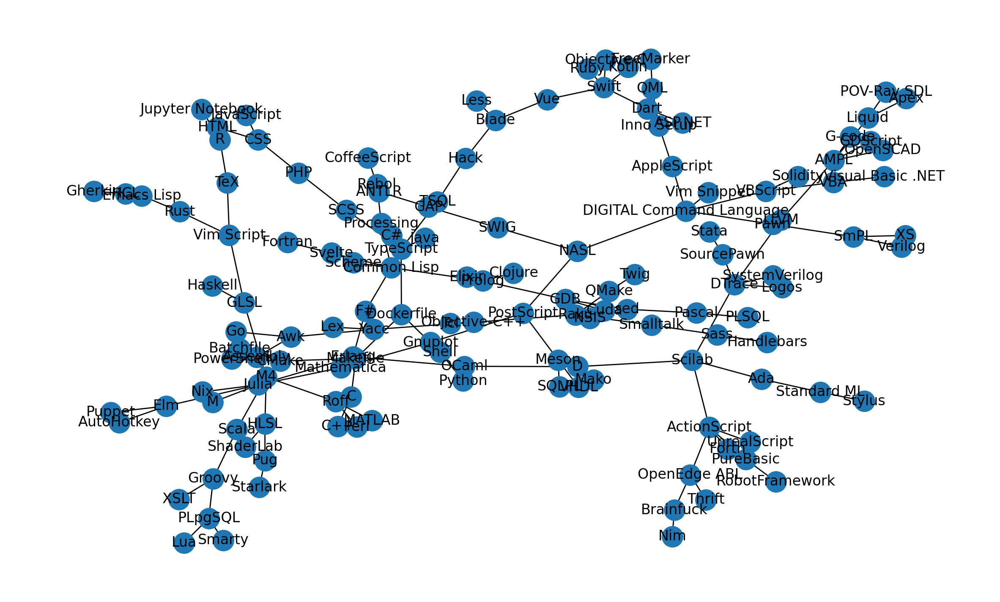

In [32]:
# network visual -- maximum spanning tree
mst_graph = nx.from_pandas_edgelist(mst_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(15,9))
nx.draw(mst_graph, with_labels=True, ax=ax)

In [33]:
# figure out numbers
n_nodes = mst_graph.number_of_nodes()
n_edges = n_nodes * 2
n_edges

284

In [34]:
def add_edges(mst_edges, all_edges, nr_edges_to_add):
    # drop mst edges from the full edgelist
    mst_edges["drop"] = 1
    all_edges = pd.merge(
        all_edges,
        mst_edges,
        on = ["language_1", "language_2", "proximity"],
        how="left"
    )
    all_edges = all_edges[all_edges["drop"] != 1].drop(columns="drop")

    # sort and select
    all_edges = all_edges.sort_values(by="proximity", ascending=False).iloc[:nr_edges_to_add]

    # add to mst edgelist
    software_space_el = pd.concat([mst_el, all_edges])
    return software_space_el

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

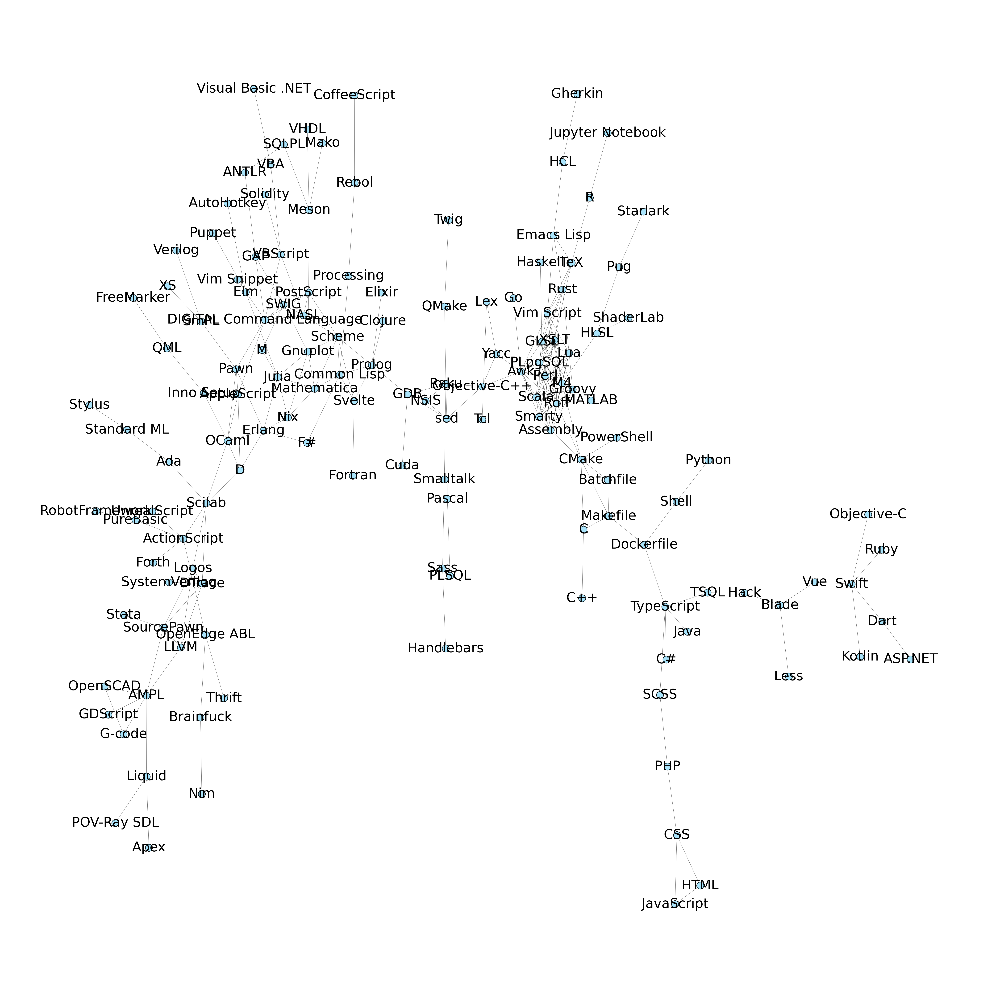

In [35]:
# network visual -- full software space
software_space_el = add_edges(mst_el, space_table, nr_edges_to_add=n_edges)
ss_graph = nx.from_pandas_edgelist(software_space_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(40,40))
pos = nx.drawing.nx_agraph.graphviz_layout(ss_graph,prog='neato')

nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=1,edgecolors='black')

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')

nx.draw_networkx_labels(ss_graph,
    pos,font_size=30)

plt.axis('off')

In [36]:
posh_list=['Stata','Julia','Mathematica','GAP','Elm','OCaml','VBA','Fortran','Cuda','Pascal','sed','Perl','awk','MATLAB','R',
'C','C++','Python','Java','Typescript','Javascript','HTML','CSS','C#','Swift','Kotlin','UnrealScript','Lisp']

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

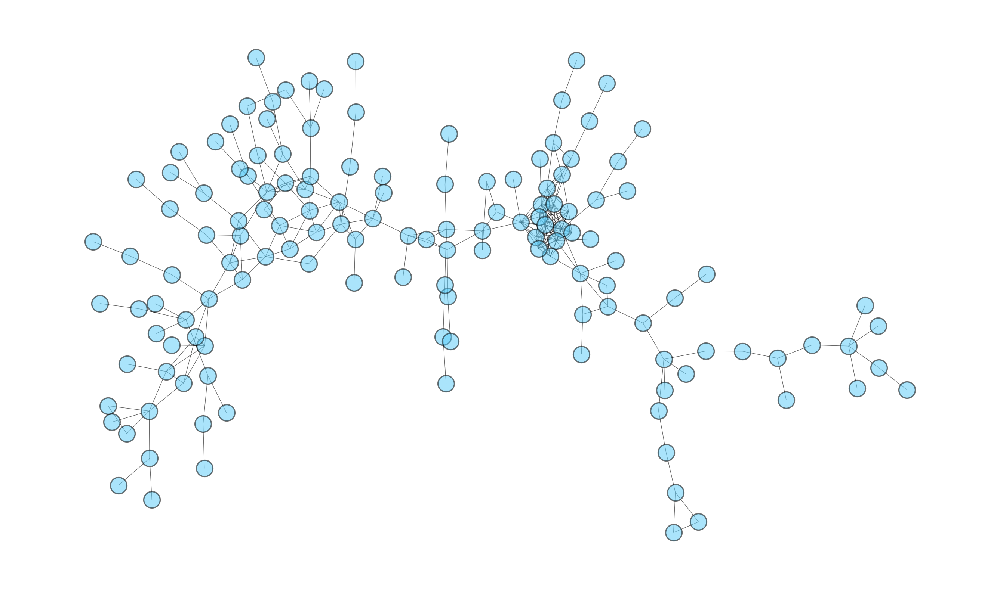

In [37]:
# network visual -- full software space
software_space_el = add_edges(mst_el, space_table, nr_edges_to_add=n_edges)
ss_graph = nx.from_pandas_edgelist(software_space_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(17,10))
pos = nx.drawing.nx_agraph.graphviz_layout(ss_graph,prog='neato')

nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')

#nx.draw_networkx_labels(ss_graph.subgraph(posh_list),bbox = dict(facecolor = "white",boxstyle='round'),
#    pos=pos,font_size=15)

plt.axis('off')

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

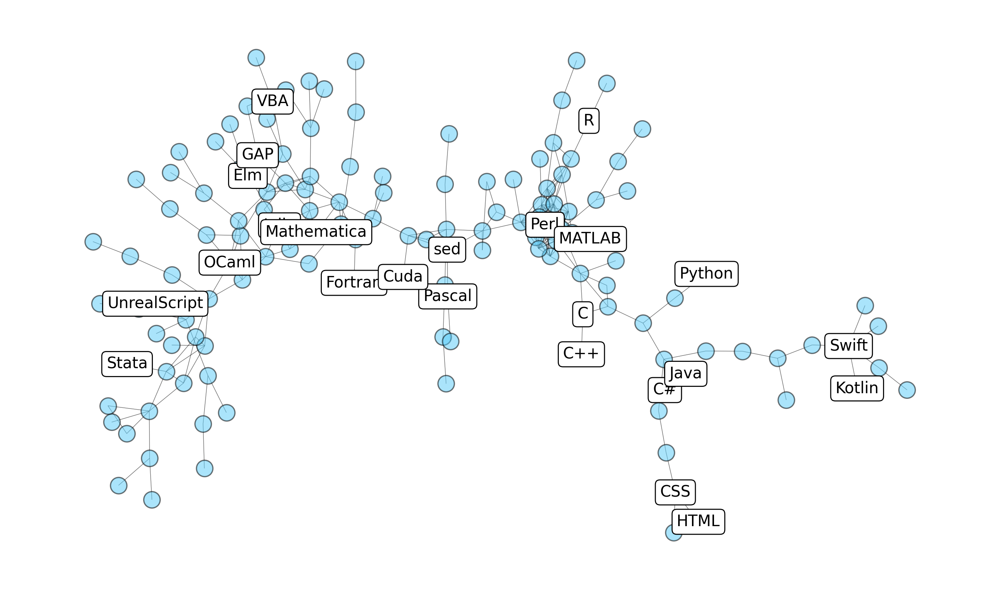

In [38]:
# network visual -- full software space
software_space_el = add_edges(mst_el, space_table, nr_edges_to_add=n_edges)
ss_graph = nx.from_pandas_edgelist(software_space_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(17,10))
pos = nx.drawing.nx_agraph.graphviz_layout(ss_graph,prog='neato')

nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')

nx.draw_networkx_labels(ss_graph.subgraph(posh_list),bbox = dict(facecolor = "white",boxstyle='round'),
    pos=pos,font_size=15)

plt.axis('off')

In [39]:
# export for Herr Wachs
software_space_el.to_csv("../outputs/software_space_edgelist.csv", index=False, sep=";")

In [40]:
def software_space_of_country(el, complexity_table, country_code):
    # focal country
    ctable = complexity_table[complexity_table["iso2_code"]==country_code]
    
    # RCA filter
    ctable = ctable[ctable["rca"] >= 1]

    cel = pd.merge(
        el,
        ctable[["language", "rca"]].drop_duplicates(),
        left_on="language_1",
        right_on="language",
        how="left"
    )
    cel = pd.merge(
        cel,
        ctable[["language", "rca"]].drop_duplicates(),
        left_on="language_2",
        right_on="language",
        how="left",
        suffixes=["_i", "_j"]
    )

    # filter cel
    cel = cel.dropna(subset=["rca_i", "rca_j"])
    
    # clean up
    cel = cel[["language_1", "language_2", "proximity"]]

    return cel

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

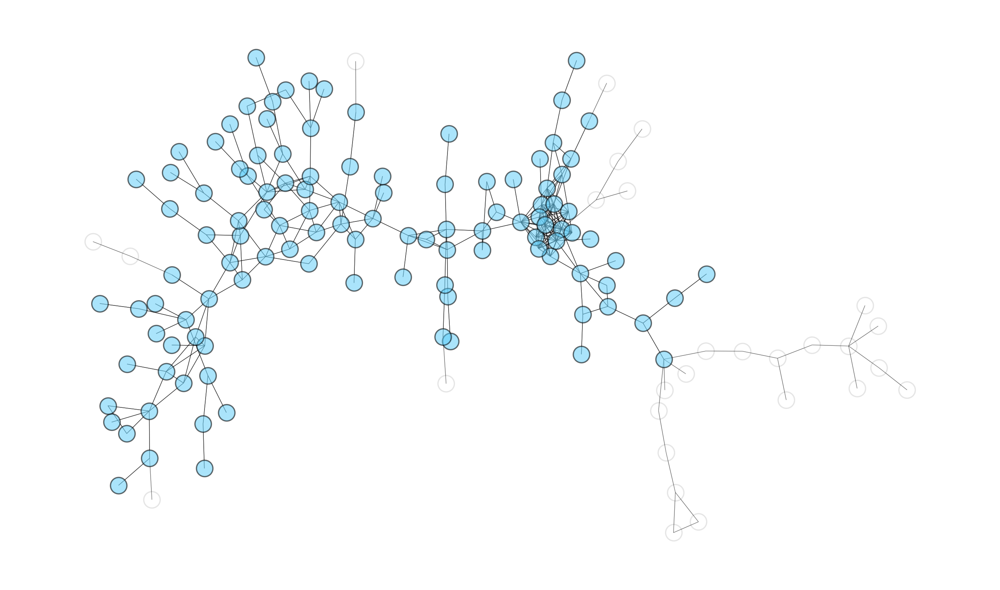

In [41]:
selected_el = software_space_of_country(software_space_el, cdf, country_code="DE")
selected_graph = nx.from_pandas_edgelist(selected_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(17,10))

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)


nx.draw_networkx_edges(selected_graph,pos=pos,edge_color='black',width=.5,alpha=.6)

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')
plt.axis('off')

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

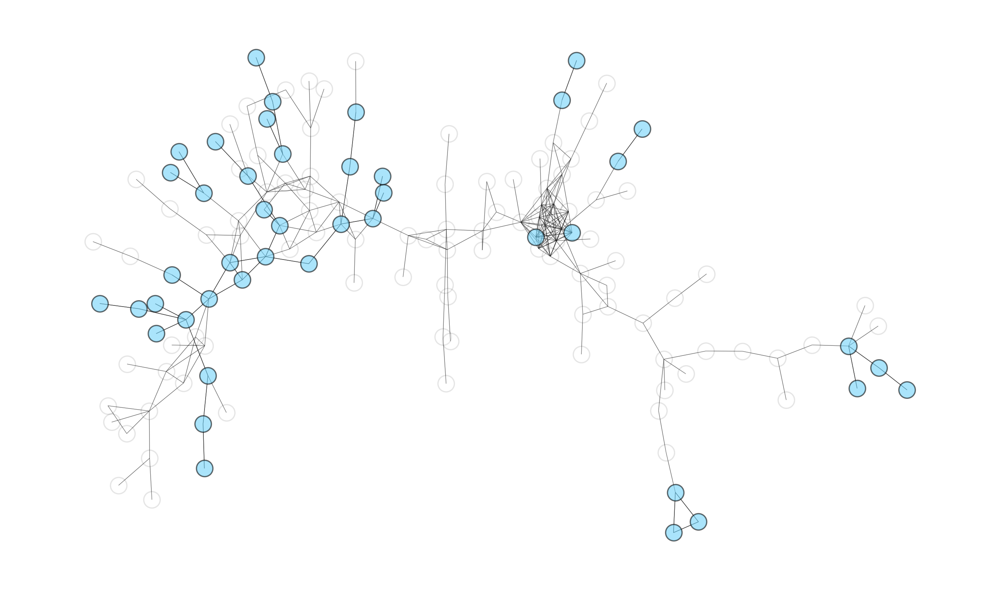

In [42]:
selected_el = software_space_of_country(software_space_el, cdf, country_code="IN")
selected_graph = nx.from_pandas_edgelist(selected_el, source="language_1", target="language_2")
fig, ax = plt.subplots(1,1, figsize=(17,10))
nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')
nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)
nx.draw_networkx_edges(selected_graph,pos=pos,edge_color='black',width=.5,alpha=.6)
nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')
nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')
plt.axis('off')

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

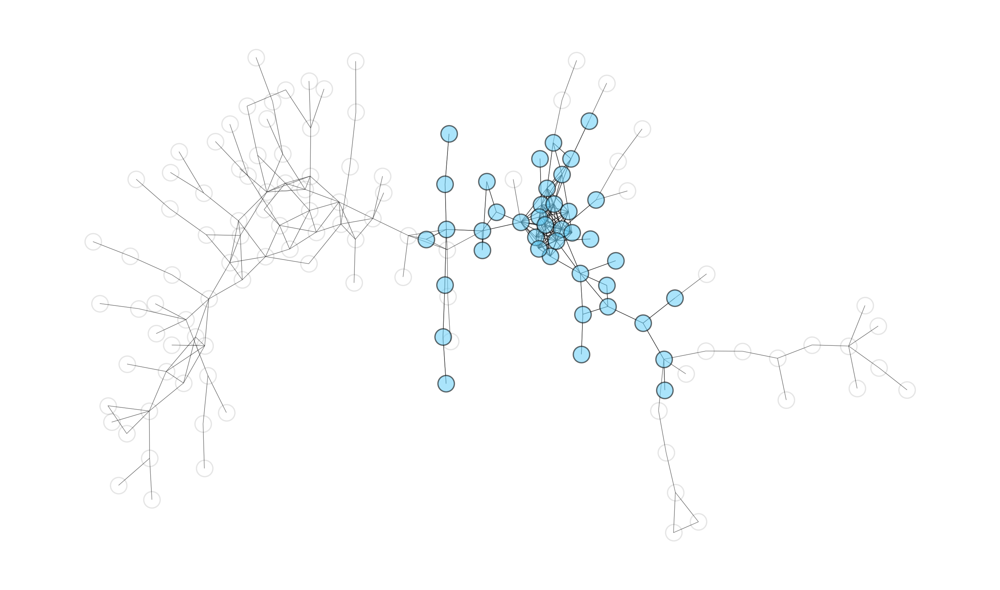

In [43]:
# hungary
selected_el = software_space_of_country(software_space_el, cdf, country_code="AT")
selected_graph = nx.from_pandas_edgelist(selected_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(17,10))

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)


nx.draw_networkx_edges(selected_graph,pos=pos,edge_color='black',width=.5,alpha=.6)

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')
plt.axis('off')

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

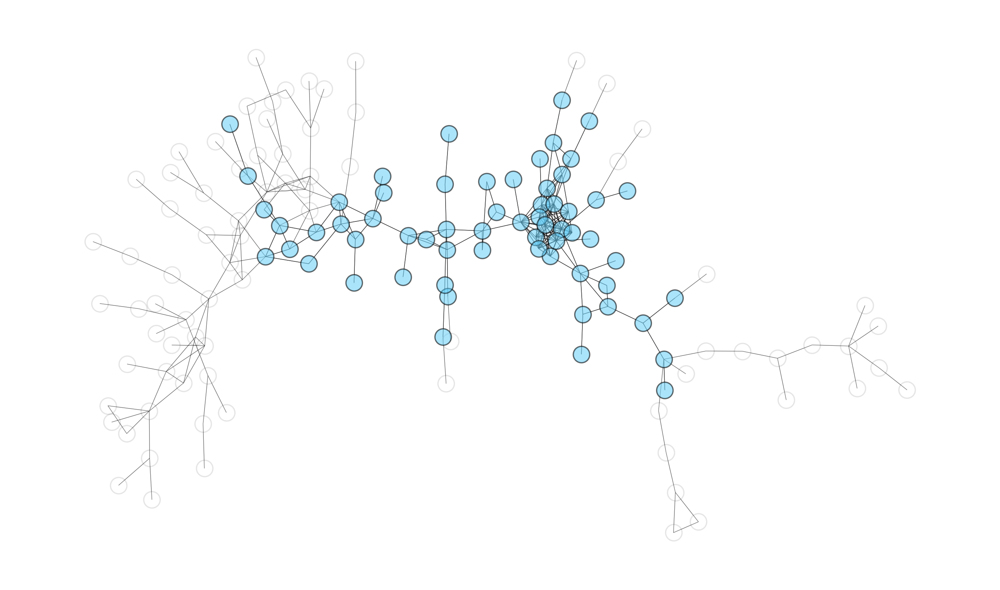

In [44]:
# hungary
selected_el = software_space_of_country(software_space_el, cdf, country_code="SE")
selected_graph = nx.from_pandas_edgelist(selected_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(17,10))

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)


nx.draw_networkx_edges(selected_graph,pos=pos,edge_color='black',width=.5,alpha=.6)

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')
plt.axis('off')

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

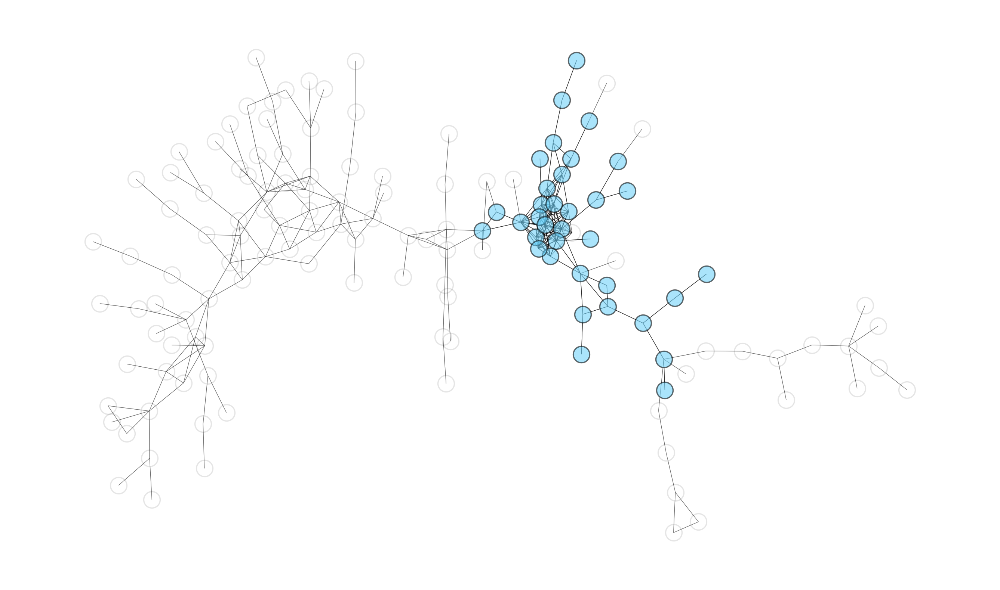

In [45]:
# hungary
selected_el = software_space_of_country(software_space_el, cdf, country_code="FI")
selected_graph = nx.from_pandas_edgelist(selected_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(17,10))

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)


nx.draw_networkx_edges(selected_graph,pos=pos,edge_color='black',width=.5,alpha=.6)

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')
plt.axis('off')

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

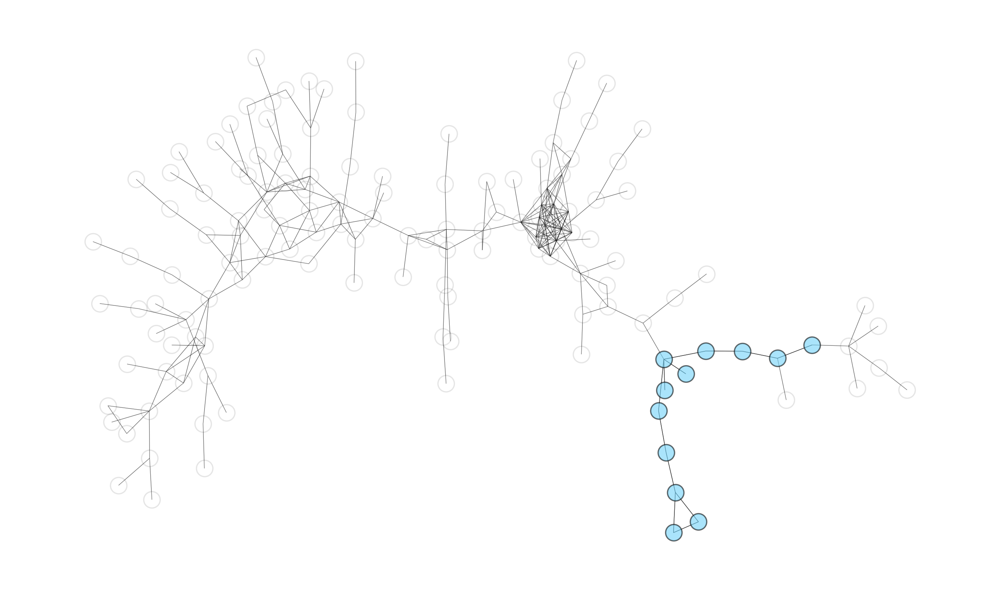

In [46]:
# hungary
selected_el = software_space_of_country(software_space_el, cdf, country_code="RS")
selected_graph = nx.from_pandas_edgelist(selected_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(17,10))

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)


nx.draw_networkx_edges(selected_graph,pos=pos,edge_color='black',width=.5,alpha=.6)

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')
plt.axis('off')

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

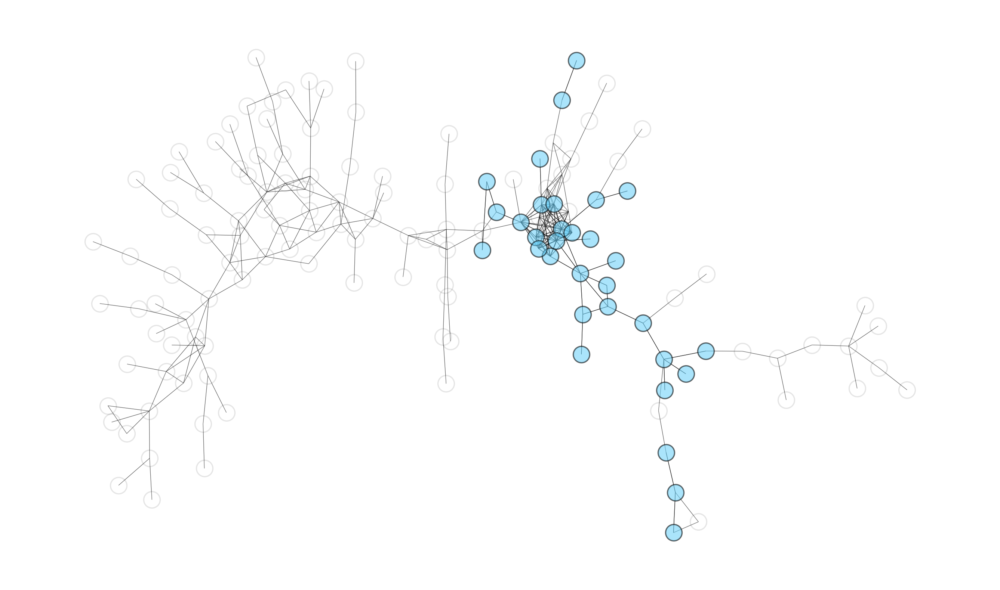

In [47]:
# hungary
selected_el = software_space_of_country(software_space_el, cdf, country_code="RO")
selected_graph = nx.from_pandas_edgelist(selected_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(17,10))

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)


nx.draw_networkx_edges(selected_graph,pos=pos,edge_color='black',width=.5,alpha=.6)

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')
plt.axis('off')

(-135.09187500000002, 2122.616875, -80.51415000000001, 1054.74415)

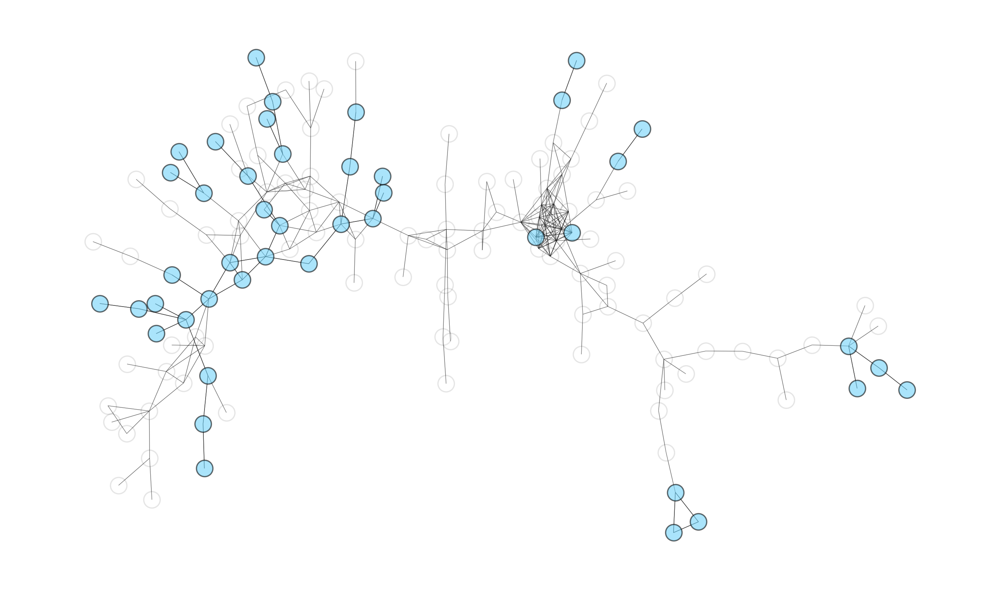

In [48]:
# hungary
selected_el = software_space_of_country(software_space_el, cdf, country_code="IN")
selected_graph = nx.from_pandas_edgelist(selected_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(17,10))

nx.draw_networkx_nodes(ss_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_edges(ss_graph,pos=pos,edge_color='black',width=.5,alpha=.6)


nx.draw_networkx_edges(selected_graph,pos=pos,edge_color='black',width=.5,alpha=.6)

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='white',linewidths=1.2, alpha=.1,edgecolors='black')

nx.draw_networkx_nodes(selected_graph, pos, node_size=250,
                       node_color='#56CBF9',linewidths=1.2, alpha=.5,edgecolors='black')
plt.axis('off')


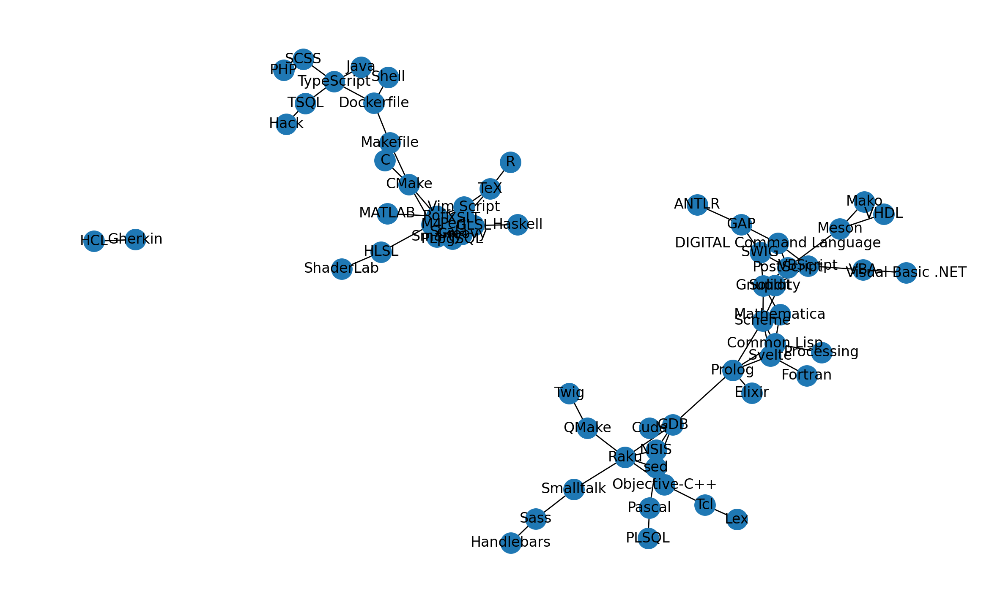

In [49]:
# spain
selected_el = software_space_of_country(software_space_el, cdf, country_code="ES")
selected_graph = nx.from_pandas_edgelist(selected_el, source="language_1", target="language_2")

fig, ax = plt.subplots(1,1, figsize=(15,9))
nx.draw(selected_graph, with_labels=True, ax=ax)

In [50]:
cdf.iso2_code.value_counts

<bound method IndexOpsMixin.value_counts of 0        AE
1        AE
2        AE
3        AE
4        AE
         ..
20869    ZW
20870    ZW
20871    ZW
20872    ZW
20873    ZW
Name: iso2_code, Length: 20874, dtype: object>

In [51]:
software_space_el.head(2)

,language_1,language_2,proximity,drop
0,AMPL,G-code,0.833333,1.0
1,AMPL,GDScript,0.750000,1.0


In [52]:
# dataframe for regression

# Ecosystem Clusters

In [53]:
# Adding community detection adding the default Girvan-Newman method. Alternative: Louvain
# Girvan, M., & Newman, M. E. (2002). Community structure in social and biological networks. 
# Proceedings of the National Academy of Sciences, 99(12), 7821-7826.

from networkx.algorithms import community
from scipy.spatial import ConvexHull
import matplotlib.patches as mpatches

# Community detection
software_space_el = add_edges(mst_el, space_table, nr_edges_to_add=n_edges)
ss_graph = nx.from_pandas_edgelist(software_space_el, source="language_1", target="language_2")
communities_generator = community.girvan_newman(ss_graph)

# Define communities (number requires more justification, inter-rated or similar)
num_communities = 5
for communities in communities_generator:
    if len(communities) >= num_communities:
        break
sorted_clusters = sorted(map(sorted, communities))
sorted_clusters

[['AMPL',
  'ActionScript',
  'Ada',
  'Apex',
  'Brainfuck',
  'DTrace',
  'Forth',
  'G-code',
  'GDScript',
  'LLVM',
  'Liquid',
  'Logos',
  'Nim',
  'OpenEdge ABL',
  'OpenSCAD',
  'POV-Ray SDL',
  'PureBasic',
  'RobotFramework',
  'Scilab',
  'SourcePawn',
  'Standard ML',
  'Stata',
  'Stylus',
  'SystemVerilog',
  'Thrift',
  'UnrealScript'],
 ['ANTLR',
  'AppleScript',
  'AutoHotkey',
  'Clojure',
  'CoffeeScript',
  'Common Lisp',
  'D',
  'DIGITAL Command Language',
  'Elixir',
  'Elm',
  'Erlang',
  'F#',
  'Fortran',
  'FreeMarker',
  'GAP',
  'Gnuplot',
  'Inno Setup',
  'Julia',
  'M',
  'Mako',
  'Mathematica',
  'Meson',
  'NASL',
  'Nix',
  'OCaml',
  'Pawn',
  'PostScript',
  'Processing',
  'Prolog',
  'Puppet',
  'QML',
  'Rebol',
  'SQLPL',
  'SWIG',
  'Scheme',
  'SmPL',
  'Solidity',
  'Svelte',
  'VBA',
  'VBScript',
  'VHDL',
  'Verilog',
  'Vim Snippet',
  'Visual Basic .NET',
  'XS'],
 ['ASP.NET',
  'Blade',
  'C#',
  'CSS',
  'Dart',
  'Dockerfile',
  'HT

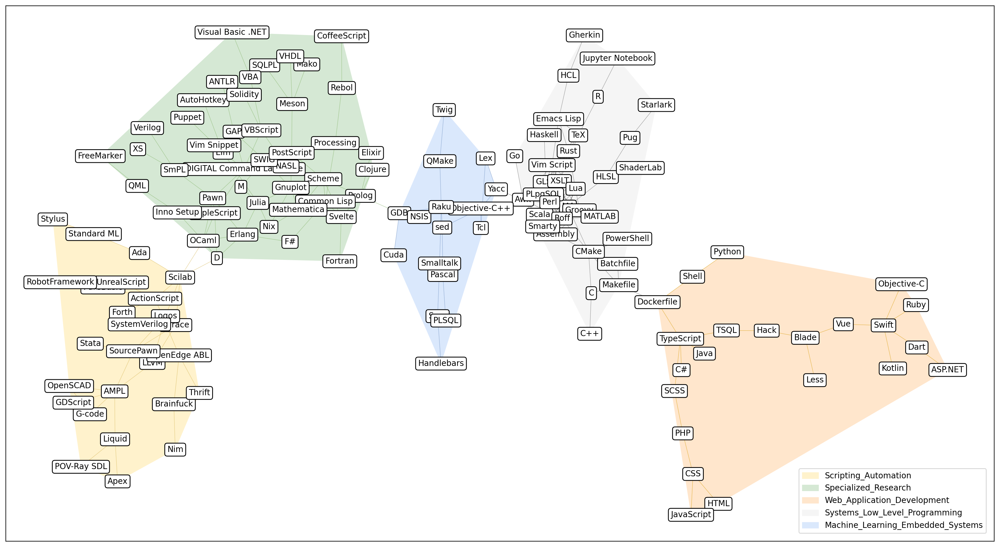

In [55]:
# Set up plot
%config InlineBackend.figure_format = 'retina'
fig, ax = plt.subplots(figsize=(22, 12))
pos = nx.drawing.nx_agraph.graphviz_layout(ss_graph, prog='neato')

# Define colors
clusters_colors = ['#FFF2CC', '#D5E8D4', '#FFE6CC', '#F5F5F5', '#DAE8FC', '#E1D5E7']
edge_colors = ['#D6B656', '#82B366', '#D79B00', '#666666', '#6C8EBF', '#9673A6']
node_cluster_color = {node: edge_colors[i] for i, cluster in enumerate(sorted_clusters) for node in cluster}

# Community backgrounds
for i, cluster in enumerate(sorted_clusters):
    cluster_pos = {k: pos[k] for k in cluster if k in pos}
    points = np.array(list(cluster_pos.values()))
    if len(points) > 2:
        hull = ConvexHull(points)
        ax.fill(points[hull.vertices, 0], points[hull.vertices, 1], clusters_colors[i], alpha=1.0)

for edge in ss_graph.edges():
    nx.draw_networkx_edges(ss_graph, pos, edgelist=[edge], edge_color=node_cluster_color.get(edge[0], 'black'), width=.5, alpha=.6)

nx.draw_networkx_nodes(ss_graph, pos, node_size=100, node_color='white', linewidths=1.0, edgecolors='black')
_ = nx.draw_networkx_labels(ss_graph, pos, bbox=dict(facecolor="white", boxstyle='round'), font_size=10)
#_ = nx.draw_networkx_labels(ss_graph.subgraph(posh_list), pos, bbox=dict(facecolor="white", boxstyle='round'), font_size=10)

# Used GPT4 to
group_names = {
    0: 'Scripting_Robotics_Automation',
    1: 'Specialized_Research',
    2: 'Web_Application_Development',
    3: 'Systems_Low_Level_Programming',
    4: 'Machine_Learning_Embedded_Systems'
}
legend_handles = [mpatches.Patch(color=clusters_colors[i], label=name) for i, name in group_names.items()]
plt.legend(handles=legend_handles, loc='lower right', borderaxespad=1)

plt.savefig('software_clusters.png', dpi=300, bbox_inches='tight')
plt.show()

In [56]:
# Check
len(df["language"].unique())

142

In [58]:
# Load output from 01_data_prep
clusters_df = pd.read_csv("../outputs/data_entry_regression_2022_to_2023.csv", sep=";")

# Mapping each language in df to its community
language_to_group = {language: group_names[i] for i, cluster in enumerate(sorted_clusters) for language in cluster}
clusters_df['group'] = clusters_df['language'].map(language_to_group)

display(language_to_group)

{'AMPL': 'Scripting_Automation',
 'ActionScript': 'Scripting_Automation',
 'Ada': 'Scripting_Automation',
 'Apex': 'Scripting_Automation',
 'Brainfuck': 'Scripting_Automation',
 'DTrace': 'Scripting_Automation',
 'Forth': 'Scripting_Automation',
 'G-code': 'Scripting_Automation',
 'GDScript': 'Scripting_Automation',
 'LLVM': 'Scripting_Automation',
 'Liquid': 'Scripting_Automation',
 'Logos': 'Scripting_Automation',
 'Nim': 'Scripting_Automation',
 'OpenEdge ABL': 'Scripting_Automation',
 'OpenSCAD': 'Scripting_Automation',
 'POV-Ray SDL': 'Scripting_Automation',
 'PureBasic': 'Scripting_Automation',
 'RobotFramework': 'Scripting_Automation',
 'Scilab': 'Scripting_Automation',
 'SourcePawn': 'Scripting_Automation',
 'Standard ML': 'Scripting_Automation',
 'Stata': 'Scripting_Automation',
 'Stylus': 'Scripting_Automation',
 'SystemVerilog': 'Scripting_Automation',
 'Thrift': 'Scripting_Automation',
 'UnrealScript': 'Scripting_Automation',
 'ANTLR': 'Specialized_Research',
 'AppleScript'

In [59]:
clusters_df.to_csv("../outputs/data_entry_regression_2022_to_2023_clusters.csv", index=False, sep=";")

In [60]:
clusters_df

,iso2_code,language,entry01,consider00,pci,rca01,rel_density,group
0,AE,Assembly,0,1,1.930404,0.0,0.000000,Systems_Low_Level_Programming
1,AE,Batchfile,0,1,1.600481,0.0,0.500000,Systems_Low_Level_Programming
2,AE,C,1,0,1.473052,0.0,0.333333,Systems_Low_Level_Programming
3,AE,C#,0,1,0.109249,0.0,1.000000,Web_Application_Development
4,AE,C++,0,1,1.367525,0.0,0.000000,Systems_Low_Level_Programming
...,...,...,...,...,...,...,...,...
2643,ZA,XSLT,0,1,2.055318,0.0,0.000000,Systems_Low_Level_Programming
2644,ZM,C,1,0,1.473052,0.0,0.000000,Systems_Low_Level_Programming
2645,ZM,PHP,1,0,-0.713058,0.0,1.000000,Web_Application_Development
2646,ZW,Dockerfile,0,1,1.199149,0.0,0.666667,Web_Application_Development


In [63]:
# Calculate the average PCI for each cluster
average_pci = clusters_df.groupby('group')['pci'].mean()
print(average_pci)

group
Machine_Learning_Embedded_Systems    1.855287
Scripting_Automation                 2.264740
Specialized_Research                 2.157048
Systems_Low_Level_Programming        1.679728
Web_Application_Development         -0.308899
Name: pci, dtype: float64


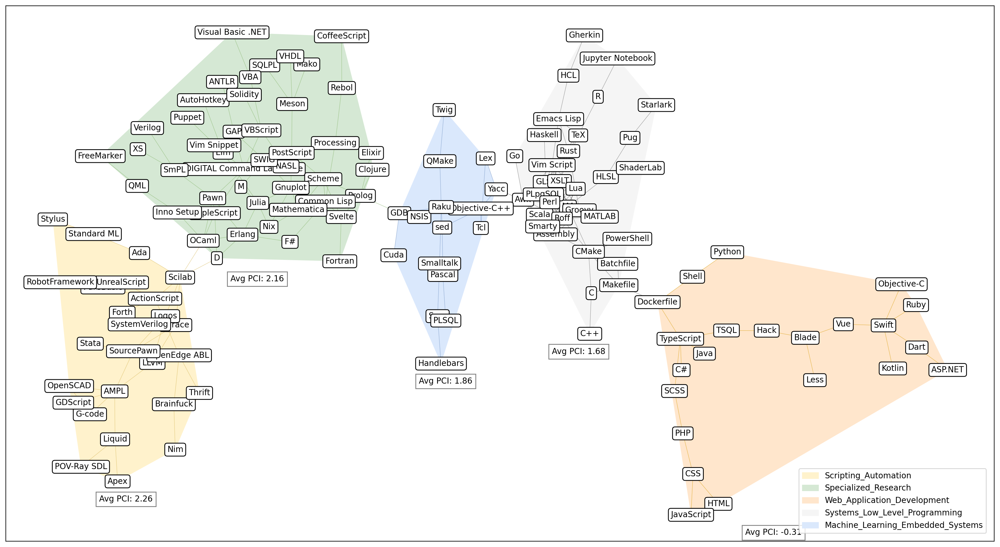

In [74]:
# Set up plot
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
from scipy.spatial import ConvexHull
import matplotlib.patches as mpatches

fig, ax = plt.subplots(figsize=(22, 12))
pos = nx.drawing.nx_agraph.graphviz_layout(ss_graph, prog='neato')

clusters_colors = ['#FFF2CC', '#D5E8D4', '#FFE6CC', '#F5F5F5', '#DAE8FC', '#E1D5E7']
edge_colors = ['#D6B656', '#82B366', '#D79B00', '#666666', '#6C8EBF', '#9673A6']
node_cluster_color = {node: edge_colors[i] for i, cluster in enumerate(sorted_clusters) for node in cluster}

# Community backgrounds
for i, cluster in enumerate(sorted_clusters):
    cluster_pos = {k: pos[k] for k in cluster if k in pos}
    points = np.array(list(cluster_pos.values()))
    if len(points) > 2:
        hull = ConvexHull(points)
        ax.fill(points[hull.vertices, 0], points[hull.vertices, 1], clusters_colors[i], alpha=1.0)

for edge in ss_graph.edges():
    nx.draw_networkx_edges(ss_graph, pos, edgelist=[edge], edge_color=node_cluster_color.get(edge[0], 'black'), width=.5, alpha=.6)

nx.draw_networkx_nodes(ss_graph, pos, node_size=100, node_color='white', linewidths=1.0, edgecolors='black')
_ = nx.draw_networkx_labels(ss_graph, pos, bbox=dict(facecolor="white", boxstyle='round'), font_size=10)

# Avg PCI for each cluster
average_pci_values = clusters_df.groupby('group')['pci'].mean()

for i, cluster in enumerate(sorted_clusters):
    cluster_name = group_names[i]
    average_pci = average_pci_values[cluster_name]
    cluster_pos = np.array([pos[node] for node in cluster if node in pos])
    min_y = cluster_pos[:, 1].min()
    annotation_pos = (cluster_pos.mean(axis=0)[0], min_y)
    ax.annotate(f'Avg PCI: {average_pci:.2f}', xy=annotation_pos, textcoords='offset points', xytext=(0, -25), ha='center', fontsize=10, bbox=dict(facecolor='white', alpha=0.5))

legend_handles = [mpatches.Patch(color=clusters_colors[i], label=name) for i, name in group_names.items()]
plt.legend(handles=legend_handles, loc='lower right', borderaxespad=1)

plt.savefig('software_clusters_annotated.png', dpi=300, bbox_inches='tight')
plt.show()